In [1]:
# Setting working directory: TFG_EduardVergesFranch
import sys
sys.path.append('..')

In [2]:
from test_pipeline_tools.METRICS import *


import importlib 
import test_pipeline_tools.Segments_Loader as seg
importlib.reload(seg)
from test_pipeline_tools.Segments_Loader import SEGMENTS_LOADER
from test_code.test_utils.training_individual_chord_model import NewModel

# Load data for TRAIN AND TEST SETS

### Baseline data

SEVA RECORDINGS

In [3]:
MC_base_path = '/home/eduard/Escritorio/pysimmusic-experiments/guitar_for_beginners/'
loader = SEGMENTS_LOADER(MC_base_path )

In [4]:
loader.base_path = os.path.join(loader.base_path,'data')
train_segments = loader.load_chromas_annotation_list('annotations/correct.txt')
train_segments.chromas.shape

(420, 12)

MUSIC CRITIC SUBMISSIONS

In [5]:
loader.base_path = os.path.join(MC_base_path,'one_time_scripts/guitar_samples_annotation/')
audio_paths = "chroma_pattern_dataset.json"

exercise_id2annotations = {
        26: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson01Ex1/l1ex1.json',
        20: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson02Ex1/l2ex1.json',
        17: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson02Ex2/l2ex2.json',
        16: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson03Ex1/l3ex1.json',
        27: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson04Ex1/l4ex1.json',
        25: MC_base_path + 'data/exercises/Leah17Dec2018/Lesson05Ex1/l5ex1.json'
    }

train_segments = loader.load_chromas_for_dataset(exercise_id2annotations,audio_paths,segments = train_segments)

Loading:  submissions/157_recording-0-2019-03-11T22-44-18-920Z-0.mp3
Loading:  submissions/187_recording-0-2019-03-13T18-52-20-147Z-0.mp3
Loading:  submissions/200_recording-0-2019-03-15T16-50-27-691Z-0.mp3
Loading:  submissions/207_recording-0-2019-03-15T17-22-22-741Z-0.mp3
Loading:  submissions/231_recording-0-2019-03-20T10-26-29-251Z-0.mp3
Loading:  submissions/238_recording-0-2019-03-20T10-43-25-477Z-0.mp3
Loading:  submissions/244_recording-0-2019-03-20T10-53-47-630Z-0.mp3
Loading:  submissions/251_recording-0-2019-03-20T11-02-33-346Z-0.mp3
Loading:  submissions/258_recording-0-2019-03-20T11-14-28-551Z-0.mp3
Loading:  submissions/278_recording-0-2019-03-20T11-38-15-759Z-0.mp3
Loading:  submissions/316_recording-0-2019-03-20T13-05-23-515Z-0.mp3
Loading:  submissions/333_recording-0-2019-03-20T14-14-00-092Z-0.mp3
Loading:  submissions/348_recording-0-2019-03-20T14-52-59-665Z-0.mp3
Loading:  submissions/409_recording-0-2019-03-21T12-28-28-861Z-0.mp3
Loading:  submissions/253_recordin

In [6]:
train_segments.chromas.shape

(1810, 12)

### Personal Dataset Files (Train / Test split)

In [7]:
ex_2_id={0:'../test_data/Lily Was Here/Lily Was Here.json',
         1:'../test_data/Mountain At My Gates/Mountain At My Gates.json',
         2:'../test_data/20th Century Boy/20th Century Boy.json',
         3:'../test_data/Where Did You Sleep Last Night/Where Did You Sleep Last Night.json',
         4:'../test_data/Hole In My Shoe/Hole In My Shoe.json',
         5:'../test_data/Runaway Train/Runaway Train.json'}

In [8]:
dataset_path = '/home/eduard/Escritorio/TFG_DATABASE_PROCESSED/'
loader = SEGMENTS_LOADER(dataset_path)

-> Split between train and test sets in my personal dataset. 

-> Add train segments to baseline train segments.

In [9]:
train_audios, test_audios, train_segments, test_segments = loader.train_test_split(ex_2_id,
                                                                                   'references.json',
                                                                                   filter_field =['Lily_'],
                                                                                  segments = train_segments)

Building Train set...
Loading:  Lily_Telecaster_108_DI.wav
Loading:  Lily_Eastman_108_Computer.wav
Loading:  Lily_Telecaster_108_Mobile.wav
Loading:  Lily_Larrivee_108_DI.wav
Loading:  Lily_Ibanez_108_Computer.wav
Loading:  Lily_Ibanez_108_DI.wav
Loading:  Lily_Epiphone_108_Mobile.wav
Loading:  Lily_Ibanez_108_Mobile.wav
Loading:  Lily_Eastman_108_Mobile.wav
Loading:  Lily_Epiphone_108_DI.wav
Loading:  Lily_Larrivee_108_Computer.wav
Loading:  Lily_Eastman_108_DI.wav
Loading:  Lily_Telecaster_108_Computer.wav
Loading:  Lily_Larrivee_108_Mobile.wav
Loading:  Lily_108_Reference.wav
Loading:  Lily_Epiphone_108_Computer.wav
Building test set ...
Loading:  Hole_Epiphone_102_Mobile.wav
Loading:  Train_Larrivee_112_Mobile.wav
Loading:  Mountain_Ibanez_104_Computer.wav
Loading:  Mountain_Larrivee_104_Computer.wav
Loading:  Century_130_Reference.wav
Loading:  Mountain_Epiphone_104_Computer.wav
Loading:  Century_Larrivee_130_DI.wav
Loading:  Century_Telecaster_130_Computer.wav
Loading:  Train_Epi

In [10]:
print('Train: {}'.format(train_segments.chromas.shape))
print('Test: {}'.format(test_segments.chromas.shape))

Train: (2850, 12)
Test: (10000, 12)


In [11]:
# import copy
# copy_test_segments = copy.deepcopy(test_segments)
# copyt_test_segments = copy.deepcopy(train_segments)

# TRAIN MODEL 
(Uncomment the model you want to use)

In [31]:
model_name = 'Baseline__Thirds_Lily'

In [32]:
m = None

Baseline

In [33]:
m = NewModel(
        {'maj': ['I', 'III', 'V'], 'min': ['I', 'IIIb', 'V'], '5': ['I', 'V'], '1': ['I', 'V', 'III']},

        {'maj': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
         'min': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
         '5': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
         '1': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200}})

Baseline thirds

In [34]:
# m = NewModel(
#         {'maj': ['I', 'III', 'V'], 'min': ['I', 'IIIb', 'V'], '5': ['I', 'V'], '1': ['I', 'V', 'III'],
#          '+3': ['I', 'III'], '-3': ['I','IIIb']},

#         {'maj': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
#          'min': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
#          '5': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
#          '1': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
#          '+3': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200},
#          '-3': {'n_components': 1, 'covariance_type': 'full', 'max_iter': 200}})

In [35]:
m.kinds

['maj', 'min', '5', '1']

In [36]:
m.fit(train_segments)
m.save_model('../RESULTS/cross-validation/models/' + model_name + '.pkl')

Now training:  maj
Now training:  min
Now training:  5
Now training:  1


# Plot some visualizations FOR TRAINING AND TESTING DATA

In [37]:
import importlib
import test_pipeline_tools.Visualization as visu
importlib.reload(visu)
from test_pipeline_tools.Visualization import CHORDS_NOTES_VISUALIZATION


In [38]:
# Process test labels

In [39]:
test_segments.labels = [x.replace('(','') for x in test_segments.labels]
test_segments.labels = [x.replace(')','') for x in test_segments.labels]

for i,p in enumerate(test_segments.labels):
    if '1,3' in p:
        test_segments.labels[i] = test_segments.labels[i].replace('1,3','+3')
    elif '1,b3' in p:
        test_segments.labels[i] = test_segments.labels[i].replace('1,b3','-3')
    else:
        pass

In [40]:
kinds = ['maj','min','1','5']#,'+3','-3']

Train


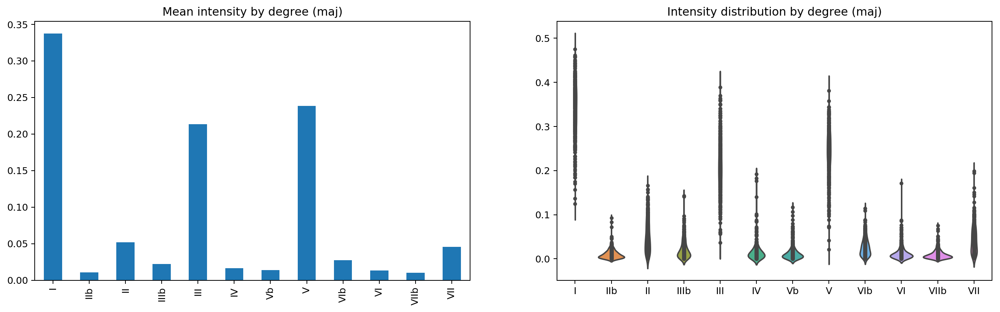

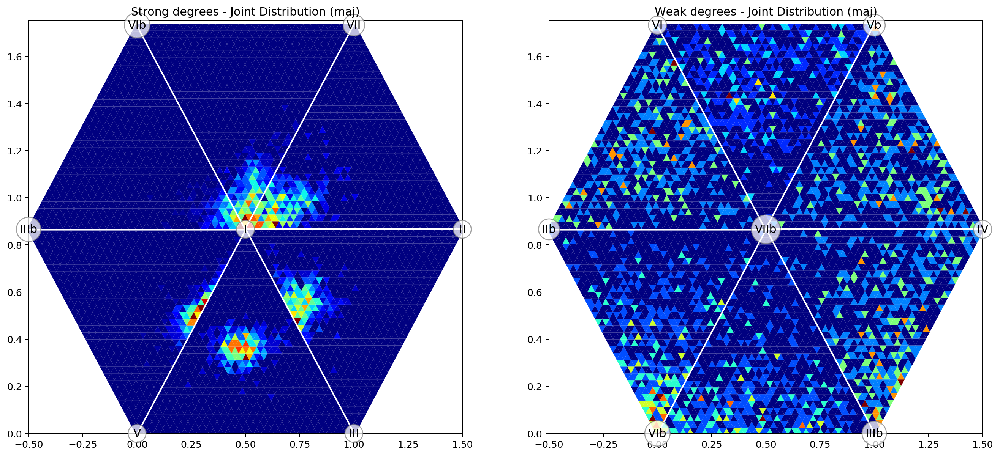

Test


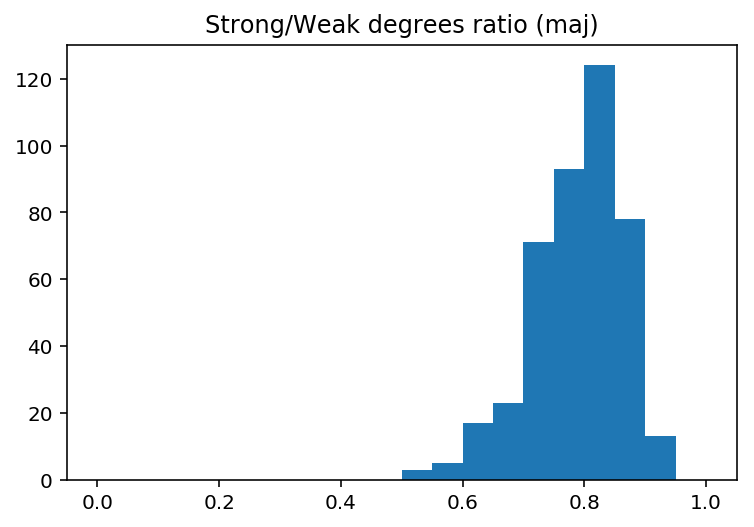

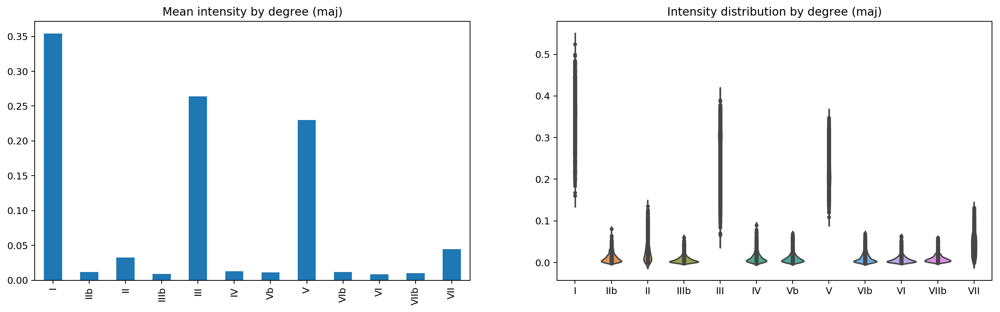

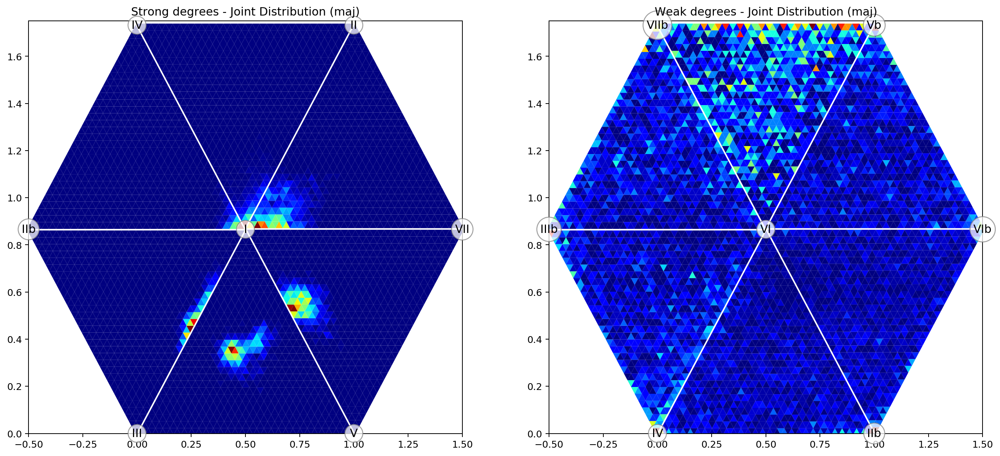

Train


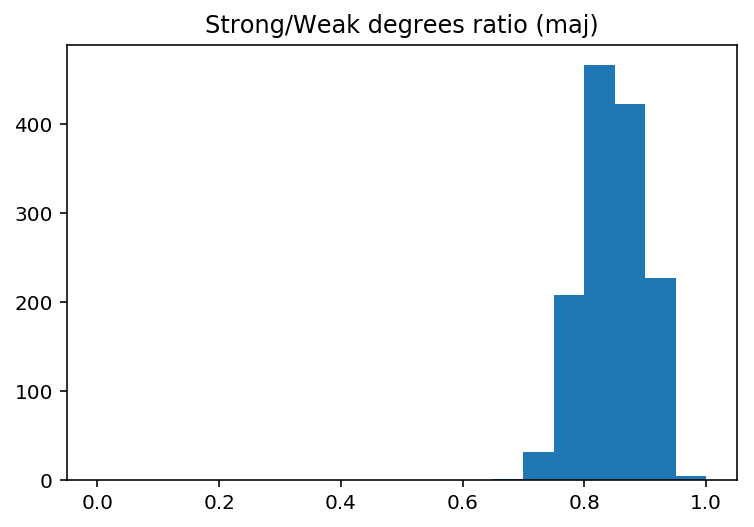

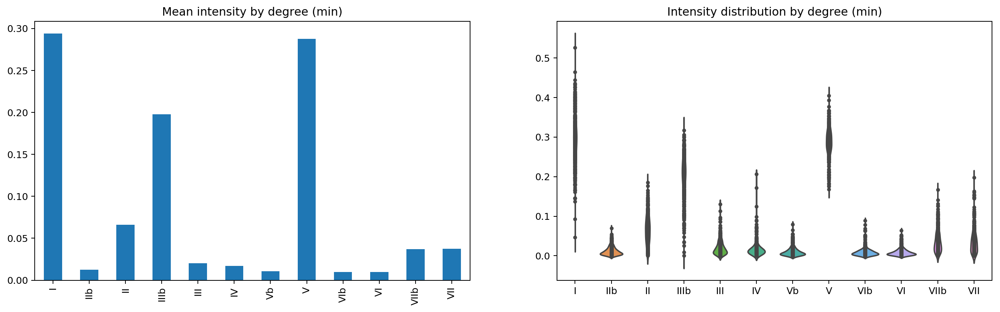

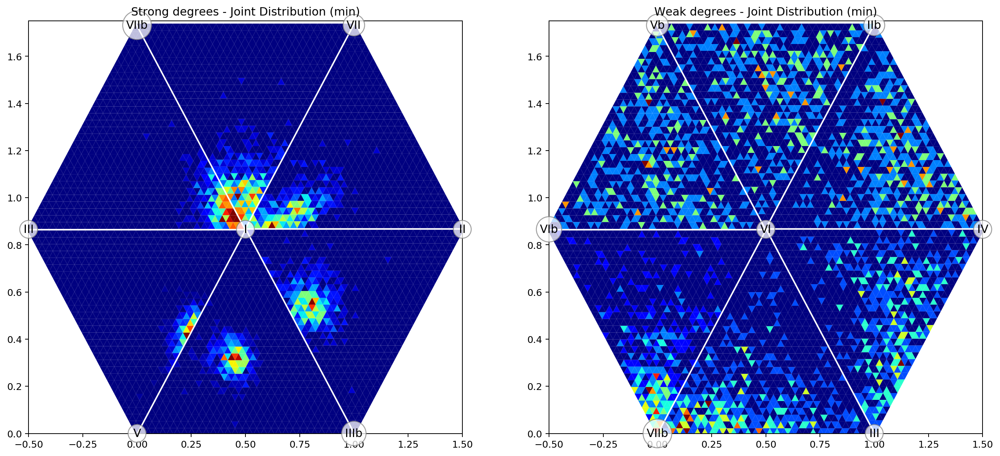

Test


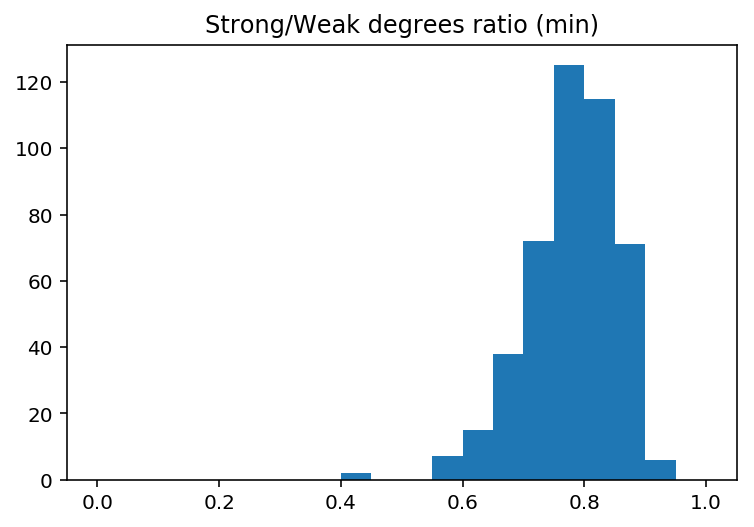

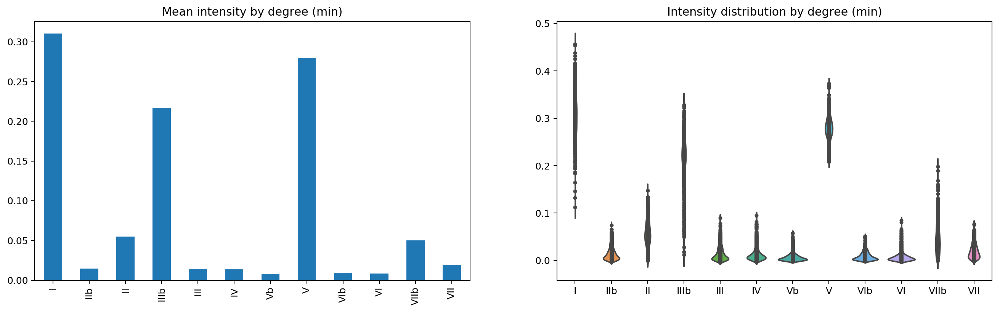

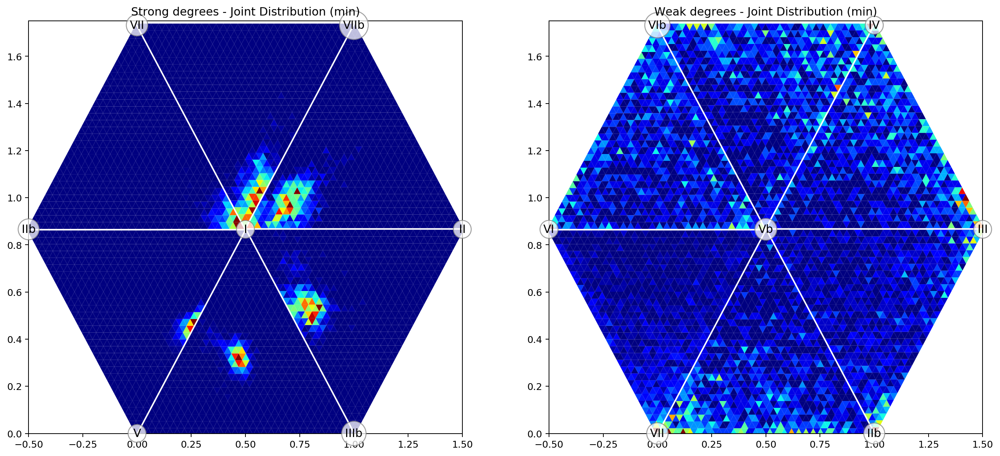

Train


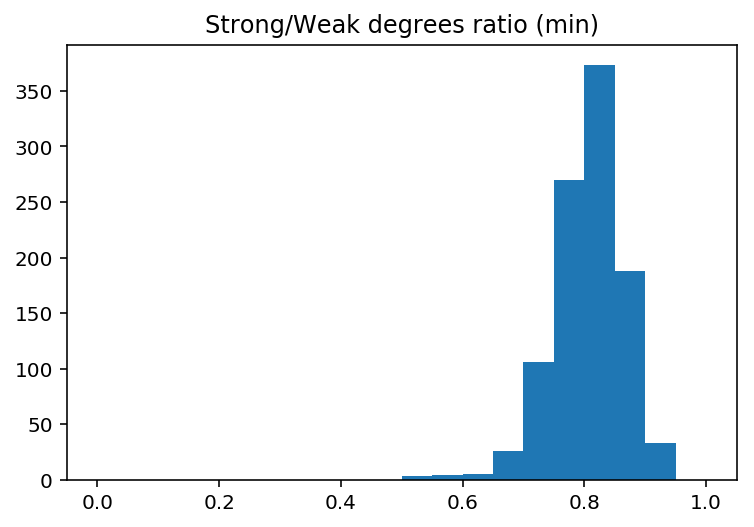

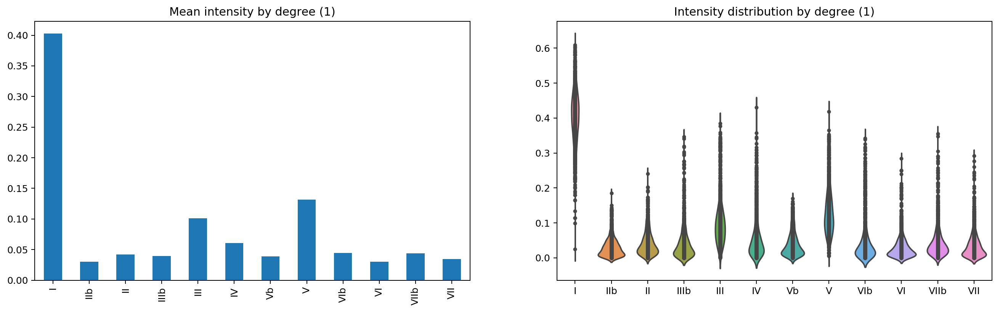

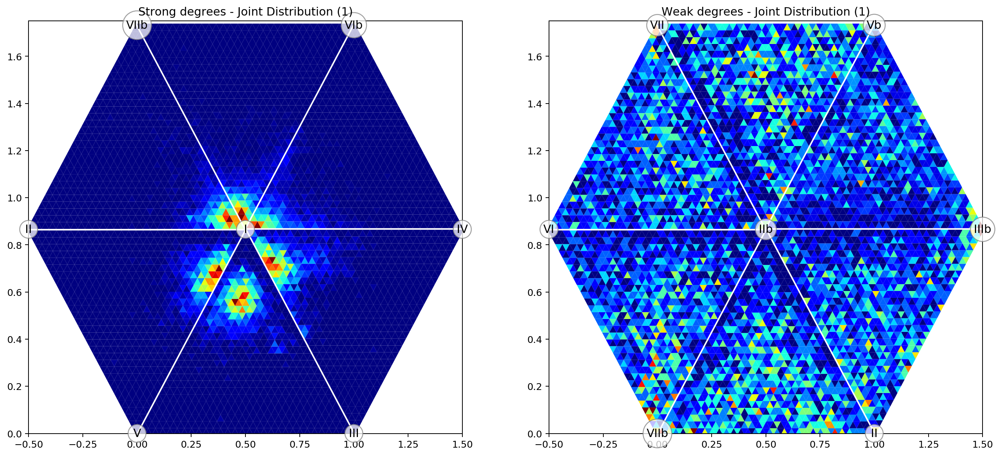

Test


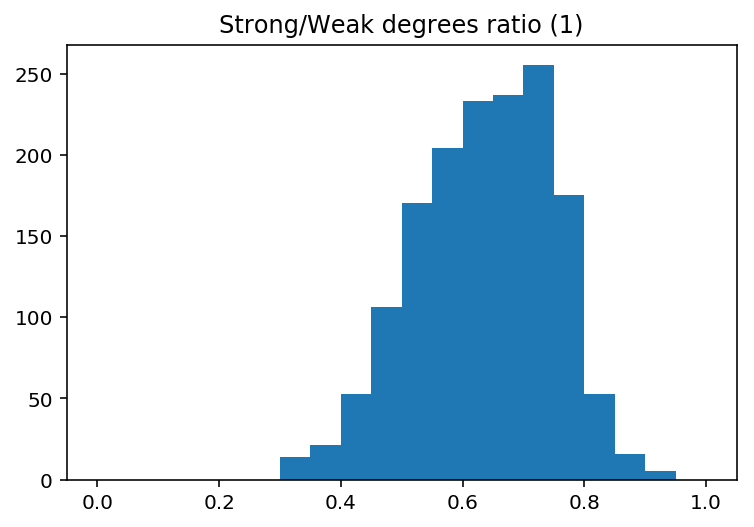

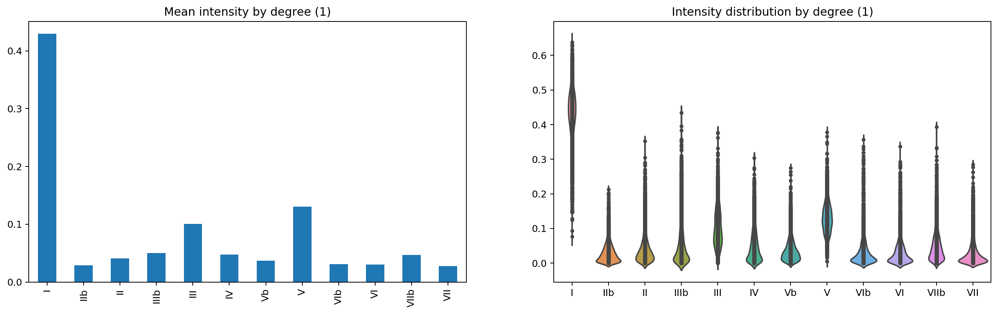

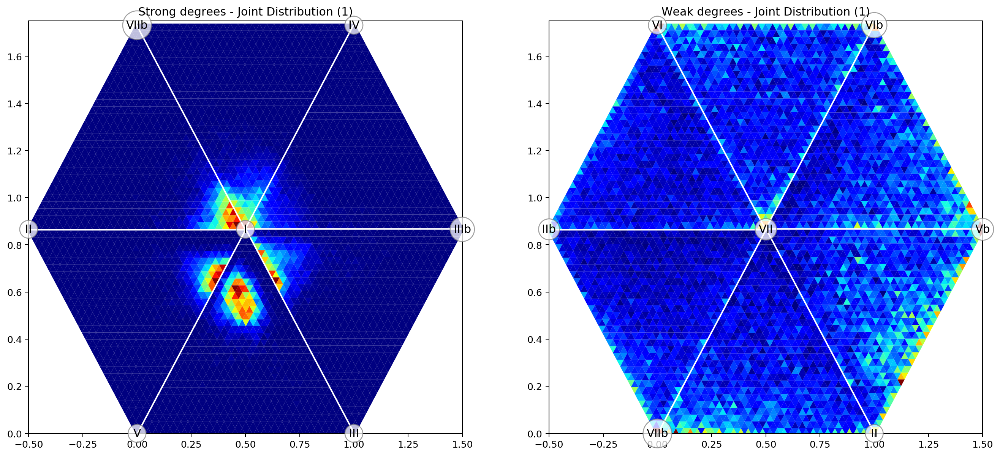

Train


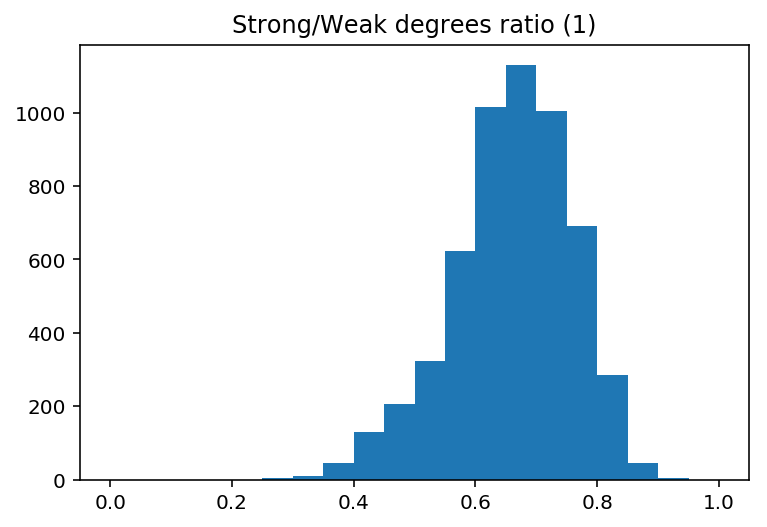

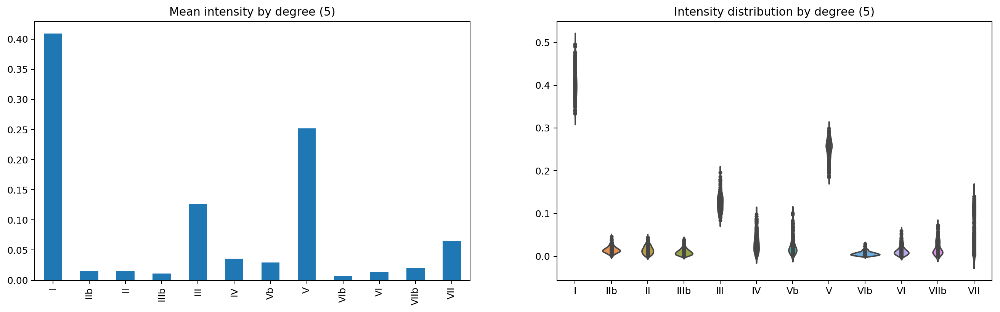

In [ ]:
for kind in kinds:
    vis = CHORDS_NOTES_VISUALIZATION(train_segments, kind=kind )
    print('Train')
    vis.plot_all()
    
    vis = CHORDS_NOTES_VISUALIZATION(test_segments,kind=kind ,normalize_to_C = True)
    print('Test')
    vis.plot_all()

# TEST model and plot Metrics

OVERALL METRICS

In [ ]:
# m = joblib.load('../RESULTS/cross-validation/models/' + 'Baseline.pkl')

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score,\
                            precision_recall_fscore_support
import test_pipeline_tools.METRICS as met
importlib.reload(met)
from test_pipeline_tools.METRICS import Overall_Metrics, accuracy_by_source

In [ ]:
pred = m.predict(test_segments.chromas)
pred = [str(p) for p in pred[0]]

In [ ]:
OM = Overall_Metrics(test_segments.labels , pred)

In [ ]:
OM.accuracy()

In [ ]:
OM.conf_matrix()

In [ ]:
OM.per_class_performance()

SOURCE METRICS

In [ ]:
accuracy_by_source(test_segments, test_audios, pred, info = False)

SONG-WISE METRICS

In [98]:
import importlib
import test_pipeline_tools.METRICS as met
importlib.reload(met)
from test_pipeline_tools.METRICS import Individual_Metrics

In [100]:
audios = []
exercises_id = []
for a in test_audios:
    audios.append(dataset_path + a['name'])
    exercises_id.append(a['exercise_id'])

In [101]:
model = ['../test_code/test_utils/models/Baseline.pkl',
         '../test_code/test_utils/models/Baseline_Thirds.pkl']

In [102]:
anno = ['/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/Runaway Train/Runaway Train.json',
       '/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/20th Century Boy/20th Century Boy.json',
       '/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/Hole In My Shoe/Hole In My Shoe.json',
       '/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/Lily Was Here/Lily Was Here.json',
       '/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/Mountain At My Gates/Mountain At My Gates.json',
       '/home/eduard/Escritorio/TFG_EduardVergesFranch/test_data/Where Did You Sleep Last Night/Where Did You Sleep Last Night.json']

m = '../RESULTS/cross-validation/Test.pkl'
song = 0
base_path = '/home/eduard/Escritorio/TFG_EduardVergesFranch/'
met = Individual_Metrics(ex_2_id[exercises_id[song]],audios[song], model = m)


Loading -----> ../RESULTS/cross-validation/Test.pkl


**Title**: Lily Was Here Guitar Initial

**Song Duration**: 86.43 sec.

**Metre**: 4/4

**Tuning**: 440Hz

**Measure duration**: 2.22 sec.

In [103]:
met.overall_accuracy()

Note duration not specified / Not Found! -> PRINTING GENERAL STATS


0.5555555555555556

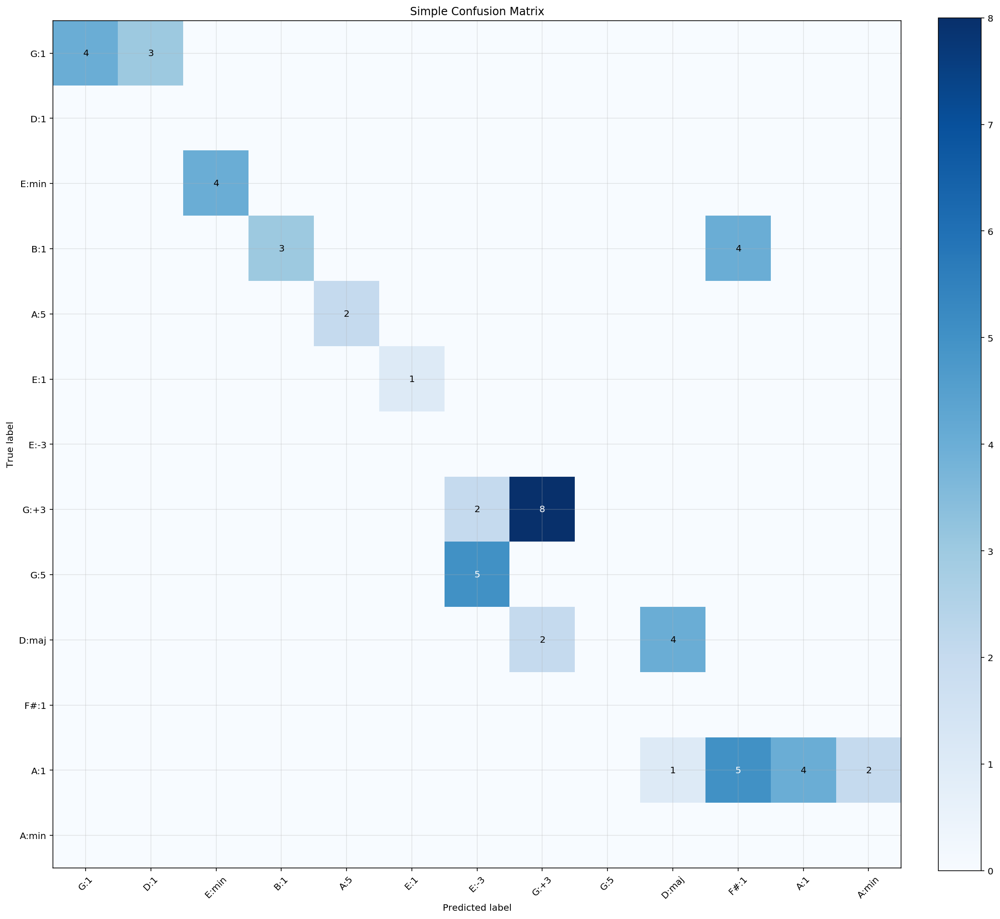

array([[4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 4, 0, 0],
       [0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 2, 8, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 5, 4, 2],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [105]:
met.plot_simple_conf_matrix()